# Extract Sample Images

In [43]:
import os
import shutil
import random
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from statistics import mean
from IPython.display import Image as IPImage, display

In [44]:
def calculate_image_quality(img_array):
    """Calculate image quality based on contrast and brightness"""
    # Convert to grayscale if it's RGB
    if len(img_array.shape) == 3:
        img_gray = np.mean(img_array, axis=2)
    else:
        img_gray = img_array
    
    # Calculate contrast (using standard deviation)
    contrast = np.std(img_gray)
    
    # Calculate brightness (using mean pixel value)
    brightness = np.mean(img_gray)
    
    # We want good contrast and moderate brightness (not too dark, not too bright)
    # Ideal brightness would be around 127 (middle of 0-255 range)
    ideal_brightness = 220
    brightness_score = 1 - abs(brightness - ideal_brightness) / max(255-ideal_brightness, ideal_brightness)
    
    return brightness_score/contrast

def select_best_image(char_path, num_samples=10):
    """Select the best image from a random sample based on contrast and brightness"""
    images = os.listdir(char_path)
    # Take a random sample of images to evaluate
    sample_images = random.sample(images, min(num_samples, len(images)))
    
    best_score = -1
    best_image = None
    
    for img_name in sample_images:
        img_path = os.path.join(char_path, img_name)
        img = Image.open(img_path)
        img_array = np.array(img)
        
        quality_score = calculate_image_quality(img_array)
        
        if quality_score > best_score:
            best_score = quality_score
            best_image = img_name
    
    return best_image

def create_image_grid(images, labels, rows, cols):
    """Create a grid of images with larger titles"""
    plt.figure(figsize=(20, 20))
    for idx, (img, label) in enumerate(zip(images, labels)):
        plt.subplot(rows, cols, idx + 1)
        plt.imshow(img)
        plt.title(label, fontsize=48)  # Increased font size and padding
        plt.axis('off')
    plt.tight_layout(pad=3.0)  # Increased padding between subplots
    return plt.gcf()

In [45]:
# Define paths
dataset_path = '../kaggle/input/synthetic-asl-alphabet/Train_Alphabet'
output_path = 'static'

# Create output directory if it doesn't exist
os.makedirs(output_path, exist_ok=True)

# Get list of all character directories
char_dirs = sorted(os.listdir(dataset_path))
print(f"Found {len(char_dirs)} characters")
print("Characters:", char_dirs)

Found 27 characters
Characters: ['A', 'B', 'Blank', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [46]:
# Extract one sample image for each character
sample_images = []
sample_labels = []

for char_dir in char_dirs:
    if char_dir == 'Blank':
        continue
    char_path = os.path.join(dataset_path, char_dir)
    
    # Select the best image based on quality
    best_image_name = select_best_image(char_path)
    best_image_path = os.path.join(char_path, best_image_name)
    
    # Open and store the image
    img = Image.open(best_image_path)
    sample_images.append(np.array(img))
    sample_labels.append(char_dir)

print(f"Extracted {len(sample_images)} sample images")

Extracted 26 sample images


In [47]:
# Create a grid of all sample images
rows = 5
cols = 6
fig = create_image_grid(sample_images, sample_labels, rows, cols)

# Save the grid as image.png with high DPI for better quality
fig.savefig(os.path.join(output_path, 'image.png'), 
            bbox_inches='tight', 
            dpi=300,
            facecolor='white',
            edgecolor='none')
plt.close()

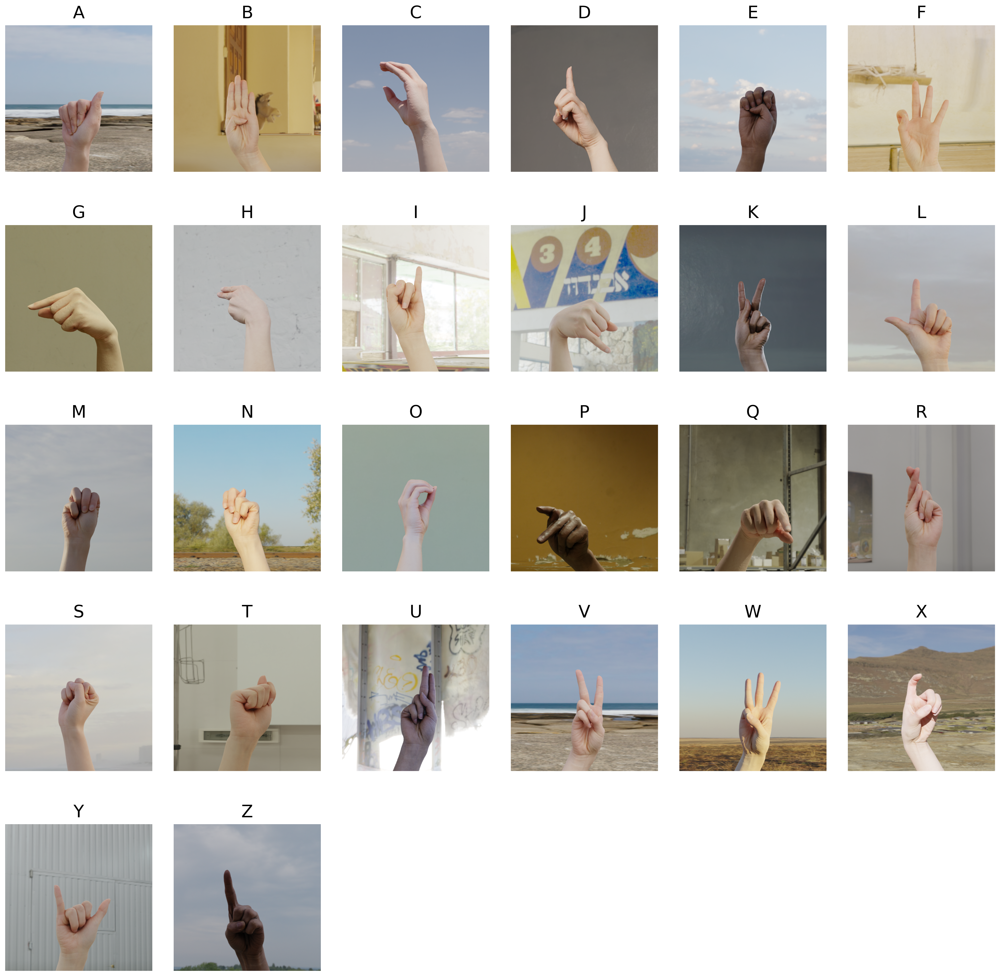

In [48]:
# Display the saved image
display(IPImage(os.path.join(output_path, 'image.png')))